#### 1. Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import cv2
EPSILON = 1e-5
from scipy.stats import norm

#### 2. Loading all the files

In [2]:
images = np.load("../../../dataset/cifar10/Ex3_cifar1025_images_cropped.npy")

In [3]:
confidence1 = np.load('numpy/Ex3_cifar1025_confidences1.npy')
confidence2 = np.load('numpy/Ex3_cifar1025_confidences2.npy')
confidence3 = np.load('numpy/Ex3_cifar1025_confidences3.npy')
confidence4 = np.load('numpy/Ex3_cifar1025_confidences4.npy')
confidence5 = np.load('numpy/Ex3_cifar1025_confidences5.npy')

In [4]:
confidences25 = np.concatenate((confidence1, confidence2, confidence3, confidence4, confidence5), axis=1) 

In [5]:
confidence1 = np.load('numpy/Ex3_cifar1050_confidences1.npy')
confidence2 = np.load('numpy/Ex3_cifar1050_confidences2.npy')
confidence3 = np.load('numpy/Ex3_cifar1050_confidences3.npy')
confidence4 = np.load('numpy/Ex3_cifar1050_confidences4.npy')
confidence5 = np.load('numpy/Ex3_cifar1050_confidences5.npy')

In [6]:
confidences50 = np.concatenate((confidence1, confidence2, confidence3, confidence4, confidence5), axis=1) 

In [7]:
confidence1 = np.load('numpy/Ex3_cifar1075_confidences1.npy')
confidence2 = np.load('numpy/Ex3_cifar1075_confidences2.npy')
confidence3 = np.load('numpy/Ex3_cifar1075_confidences3.npy')
confidence4 = np.load('numpy/Ex3_cifar1075_confidences4.npy')
confidence5 = np.load('numpy/Ex3_cifar1075_confidences5.npy')

In [8]:
confidences75 = np.concatenate((confidence1, confidence2, confidence3, confidence4, confidence5), axis=1) 

In [9]:
masked_images25 = np.load("numpy/Ex3_cifar1025_masked_images.npy")
masked_images50 = np.load("numpy/Ex3_cifar1050_masked_images.npy")
masked_images75 = np.load("numpy/Ex3_cifar1075_masked_images.npy")

In [10]:
image_mean25 = np.mean(confidences25,axis=1)
image_mean50 = np.mean(confidences50,axis=1)
image_mean75 = np.mean(confidences75,axis=1)

In [11]:
image_std25 = np.std(confidences25,axis=1)
image_std50 = np.std(confidences50,axis=1)
image_std75 = np.std(confidences75,axis=1)

In [12]:
def calculate_mae(true_images, predicted_images):
    mae_total = 0.0
    num_images = len(true_images)
    for i in range(num_images):
        mae_total += np.sum(np.abs(true_images[i].flatten() - predicted_images[i].flatten()))
    return mae_total / (num_images * true_images[0].size)

In [13]:
mae25 = calculate_mae(image_mean25, images)
print("Mean Absolute Error for 25% masking is:", format(mae25, '.6f'))
mae50 = calculate_mae(image_mean50, images)
print("Mean Absolute Error for 50% masking is:", format(mae50, '.6f'))
mae75 = calculate_mae(image_mean75, images)
print("Mean Absolute Error for 75% masking is:", format(mae75, '.6f'))

Mean Absolute Error for 25% masking is: 0.089834
Mean Absolute Error for 50% masking is: 0.060586
Mean Absolute Error for 75% masking is: 0.061343


In [14]:
sum_std25 = np.sum(image_std25,axis = (1,2,3))
sum_std50 = np.sum(image_std50,axis = (1,2,3))
sum_std75 = np.sum(image_std75,axis = (1,2,3))

In [15]:
top_indices25 = np.argsort(sum_std25)[-30:]
top_indices25 = list(reversed(top_indices25))
bottom_indices25 = np.argsort(sum_std25)[:30]
print("Top standard deviation sum for 25% masking are:", sum_std25[top_indices25[0]])
print("Bottom standard deviation sum for 25% masking are:", sum_std25[bottom_indices25[0]])

Top standard deviation sum for 25% masking are: 1174.6045
Bottom standard deviation sum for 25% masking are: 244.84987


In [16]:
top_indices50 = np.argsort(sum_std50)[-30:]
top_indices50 = list(reversed(top_indices50))
bottom_indices50 = np.argsort(sum_std50)[:30]
print("Top standard deviation sum for 50% masking are:", sum_std50[top_indices50[0]])
print("Bottom standard deviation sum for 50% masking are:", sum_std50[bottom_indices50[0]])

Top standard deviation sum for 50% masking are: 634.12866
Bottom standard deviation sum for 50% masking are: 165.79138


In [17]:
top_indices75 = np.argsort(sum_std75)[-30:]
top_indices75 = list(reversed(top_indices75))
bottom_indices75 = np.argsort(sum_std75)[:30]
print("Top standard deviation sum for 75% masking are:", sum_std75[top_indices75[0]])
print("Bottom standard deviation sum for 75% masking are:", sum_std75[bottom_indices75[0]])

Top standard deviation sum for 75% masking are: 537.26874
Bottom standard deviation sum for 75% masking are: 130.94652


In [18]:
def confidence_interval_accuracy(y_intervals, y_true):
    interval_min, interval_max = y_intervals
    indicator = np.logical_and(y_true >= interval_min, y_true <= interval_max)

    return np.mean(indicator)
def regressor_calibration_curve(y_pred, y_true, y_std, num_points=20, distribution="gaussian"):
    """
        Computes the reliability plot for a regression prediction.
        :param y_pred: model predictions, usually the mean of the predicted distribution.
        :param y_std: model predicted confidence, usually the standard deviation of the predicted distribution.
        :param y_true: ground truth labels.
    """
    alphas = np.linspace(0.0 + EPSILON, 1.0 - EPSILON, num_points + 1)
    curve_conf = []
    curve_acc = []

    for alpha in alphas:
        alpha_intervals = norm.interval(alpha, y_pred, y_std)
        acc = confidence_interval_accuracy(alpha_intervals, y_true)

        curve_conf.append(alpha)
        curve_acc.append(acc)

    return np.array(curve_conf), np.array(curve_acc)

In [19]:
image_flatten = images.flatten()
mean25_flatten = image_mean25.flatten()
std25_flatten = image_std25.flatten()
mean50_flatten = image_mean50.flatten()
std50_flatten = image_std50.flatten()
mean75_flatten = image_mean75.flatten()
std75_flatten = image_std75.flatten()

In [20]:
output_confidences_25,output_errors_25 = regressor_calibration_curve(mean25_flatten,image_flatten,std25_flatten)
output_confidences_50,output_errors_50 = regressor_calibration_curve(mean50_flatten,image_flatten,std50_flatten)
output_confidences_75,output_errors_75 = regressor_calibration_curve(mean75_flatten,image_flatten,std75_flatten)

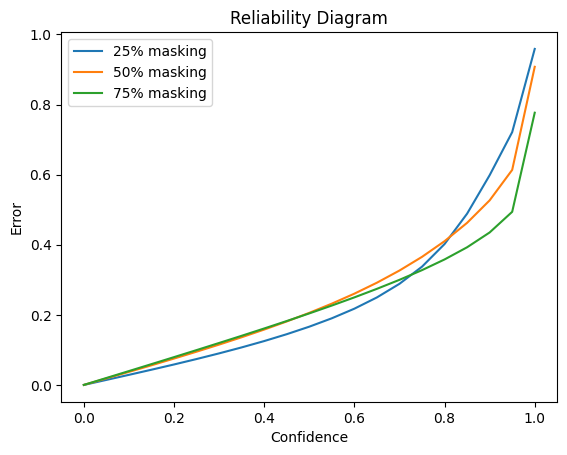

In [21]:
plt.plot(output_confidences_25, output_errors_25,label = "25% masking")   
plt.plot(output_confidences_50, output_errors_50,label = "50% masking")   
plt.plot(output_confidences_75, output_errors_75,label = "75% masking")   
plt.xlabel("Confidence")
plt.ylabel("Error")
plt.title('Reliability Diagram')
plt.legend()
plt.show()

In [22]:
new_min, new_max = 0, 1
std25_min,std25_max = image_std25.min(),image_std25.max()
std25_p = (image_std25 - std25_min)/(std25_max - std25_min)*(new_max - new_min) + new_min
std50_min,std50_max = image_std50.min(),image_std50.max()
std50_p = (image_std50 - std50_min)/(std50_max - std50_min)*(new_max - new_min) + new_min
std75_min,std75_max = image_std75.min(),image_std75.max()
std75_p = (image_std75 - std75_min)/(std75_max - std75_min)*(new_max - new_min) + new_min

In [23]:
def plot_results(original_image,masked_image, mean_image,std_image):
    w = 12
    h = 12
    fig = plt.figure(figsize=(w, h))
    columns = 4
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.axis('off')
    plt.title('Original Image')
    plt.imshow(original_image)

    fig.add_subplot(rows, columns, 2)
    plt.axis('off')
    plt.title('Masked Image')
    plt.imshow(masked_image)

    fig.add_subplot(rows, columns, 3)
    plt.axis('off')
    plt.title('Mean Output Image')
    plt.imshow(mean_image)

    fig.add_subplot(rows, columns, 4)
    plt.axis('off')
    plt.title('Standard Deviation Image')
    plt.imshow(std_image,cmap="gray")
#     cax = plt.axes([0.95, 0.11, 0.02, 0.35])
    cax = plt.axes([0.95, 0.4, 0.02, 0.2])
    colorbar = plt.colorbar(cax =cax)
    ticks = np.array([ 0.2, 0.4, 0.6, 0.8, 1.0])
    tick_labels = ['Low', 'Medium', 'High', 'Very High', 'Max']
    # Set the tick locations and labels
    colorbar.set_ticks(ticks)
    colorbar.set_ticklabels(tick_labels)
    plt.text(0.5, - 0.1, 'Level of uncertainty in each pixel ', ha='center', fontsize=12)
    plt.show()

In [24]:
def plot_std_results(std_p_0,std_p_1,std_p_2):
    w = 12
    h = 12
    fig = plt.figure(figsize=(w, h))
    columns = 3
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.axis('off')
    plt.title('STD along red channel')
    plt.imshow(std_p_0,cmap="gray")

    fig.add_subplot(rows, columns, 2)
    plt.axis('off')
    plt.title('STD along blue channel')
    plt.imshow(std_p_1,cmap="gray")

    fig.add_subplot(rows, columns, 3)
    plt.axis('off')
    plt.title('STD along green channel')
    plt.imshow(std_p_2,cmap="gray")
    cax = plt.axes([0.95, 0.38, 0.02, 0.23])
    colorbar = plt.colorbar(cax =cax)
    ticks = np.array([0.2, 0.4, 0.6, 0.8, 1.0])
    tick_labels = ['Low', 'Medium', 'High', 'Very High', 'Max']
    # Set the tick locations and labels
    colorbar.set_ticks(ticks)
    colorbar.set_ticklabels(tick_labels)
    plt.text(0.5, -0.1, 'Level of uncertainty in each channel', ha='center', fontsize=12)
    plt.show()

## 25% masking

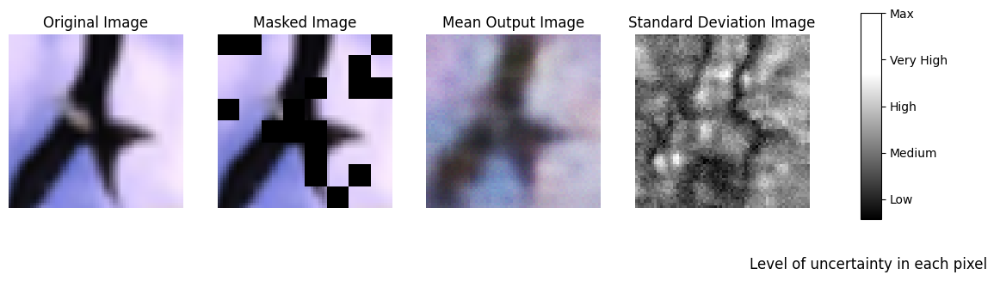

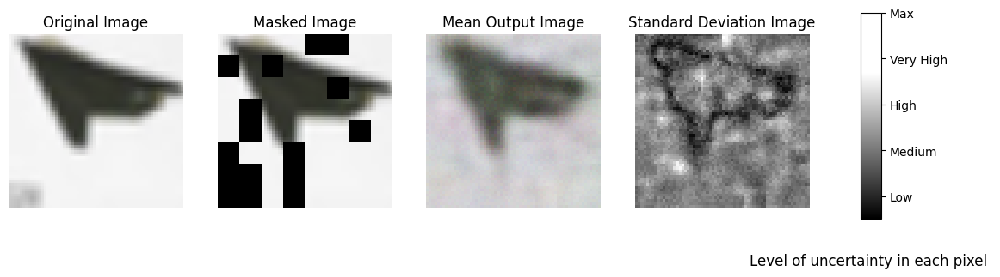

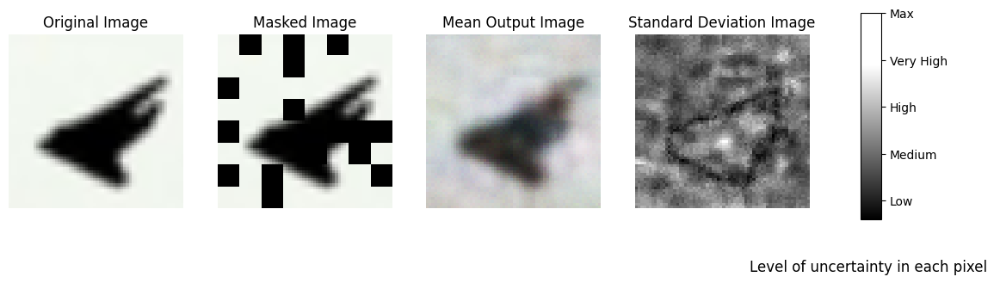

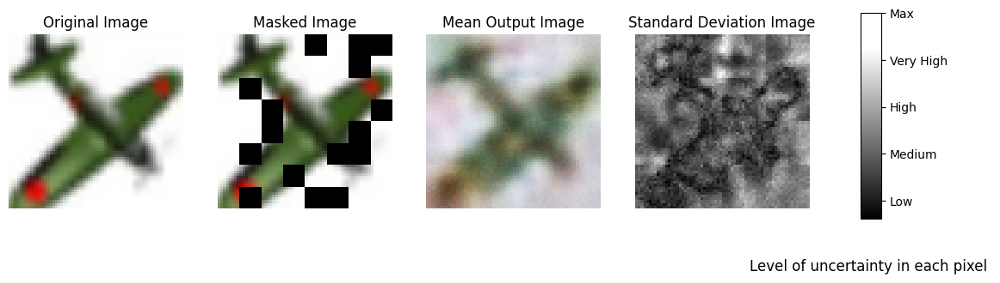

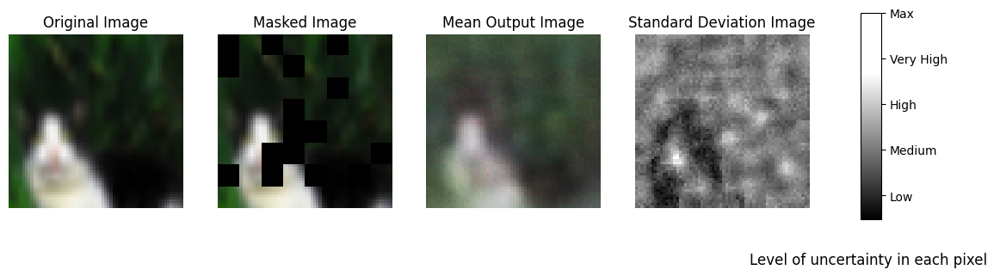

...

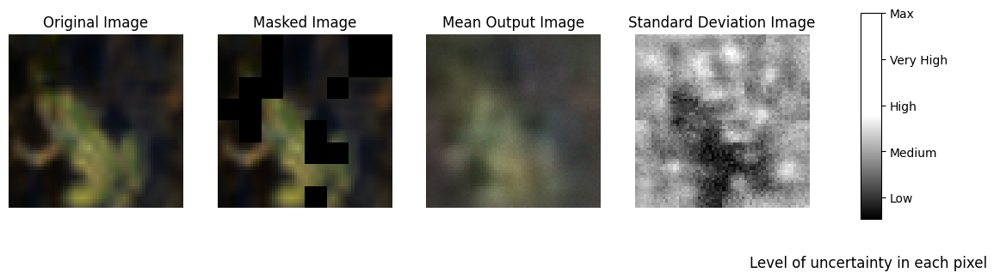

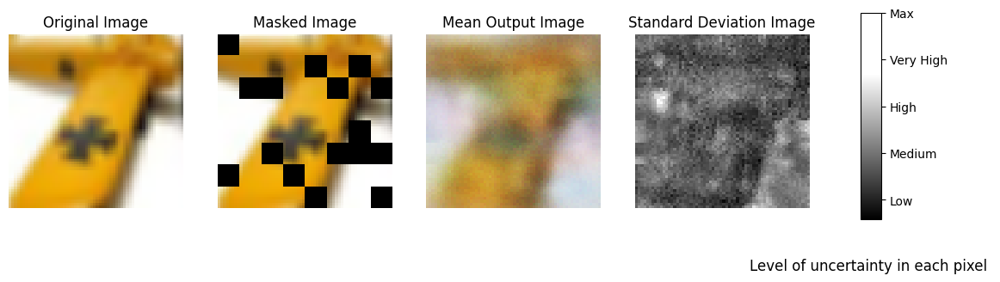

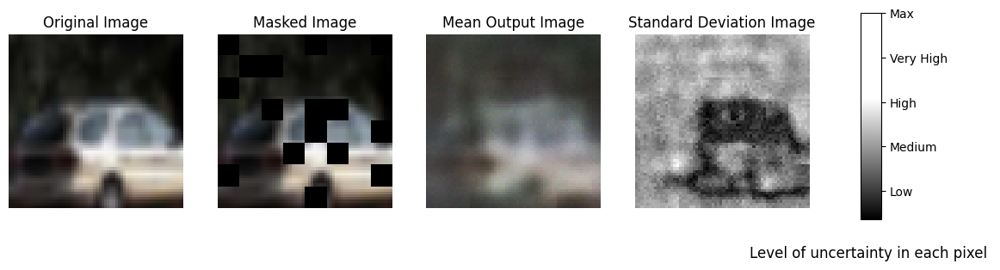

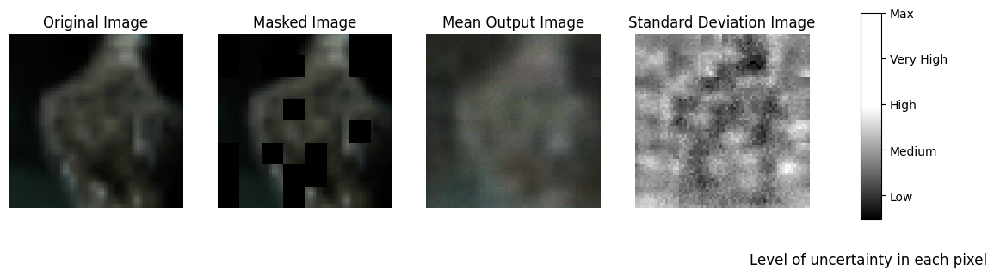

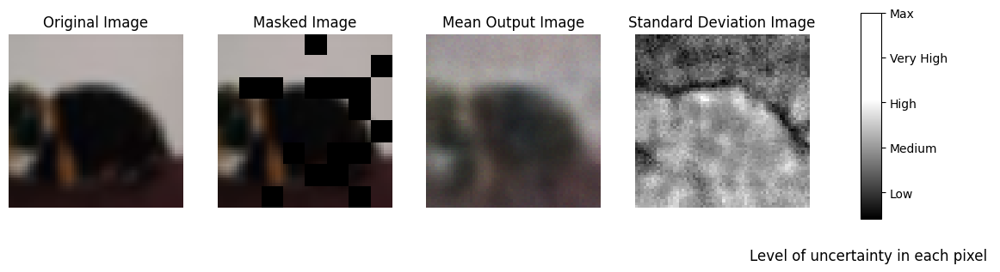

In [25]:
for i in range(30):
    std25_t_0 = np.expand_dims(std25_p[top_indices25[i],:,:,0],axis=-1)
    std25_t_1 = np.expand_dims(std25_p[top_indices25[i],:,:,1],axis=-1)
    std25_t_2 = np.expand_dims(std25_p[top_indices25[i],:,:,2],axis=-1)
    sum_std25_t = (std25_t_0 + std25_t_1 + std25_t_2)/3
    original_image = images[top_indices25[i],:,:,:]
    mask_image = masked_images25[top_indices25[i],:,:,:]
    mean_image = image_mean25[top_indices25[i],:,:,:]
    plot_results(original_image,mask_image,mean_image,sum_std25_t)

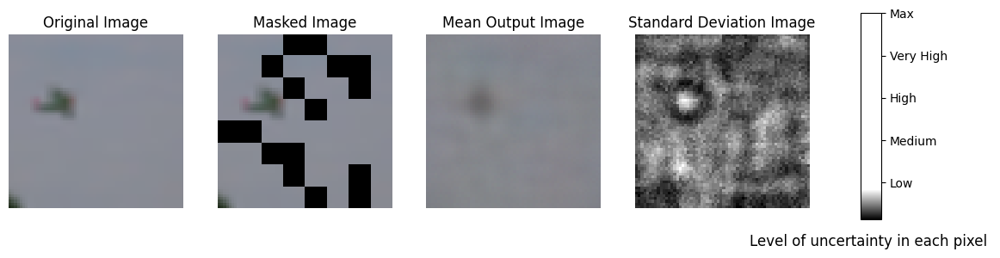

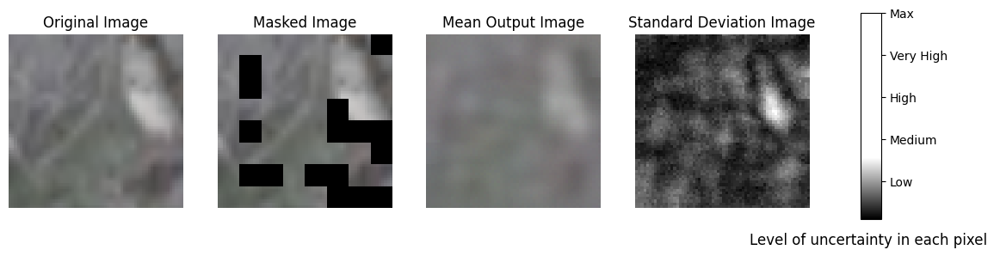

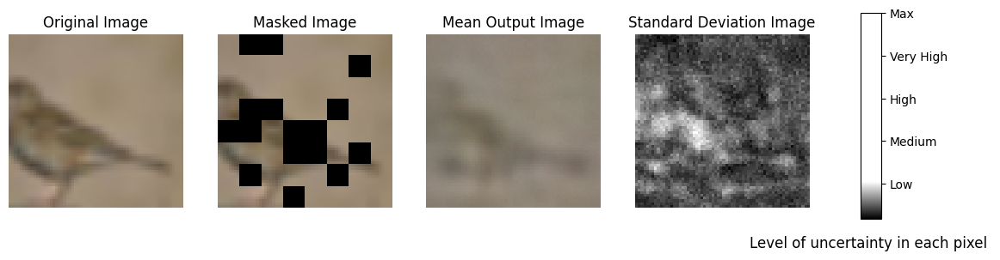

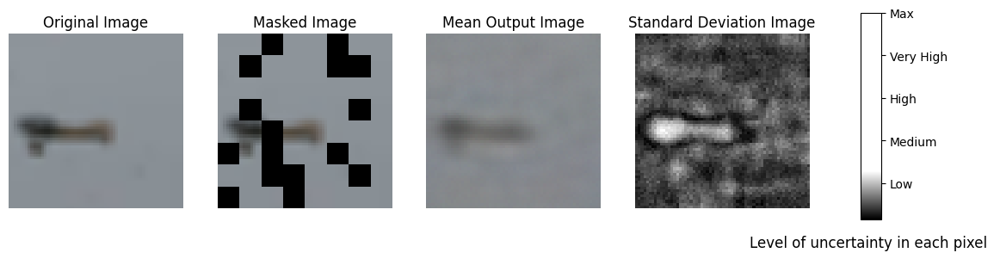

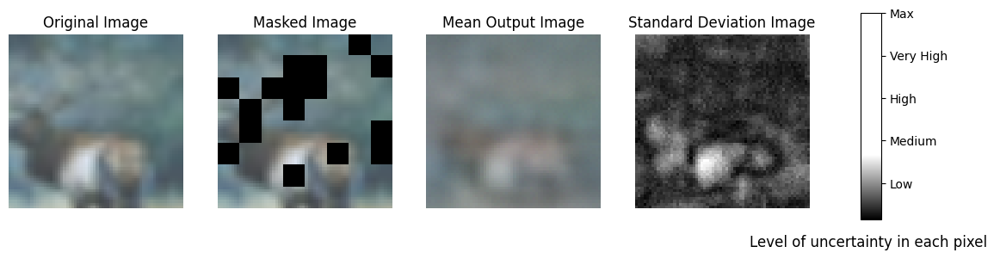

...

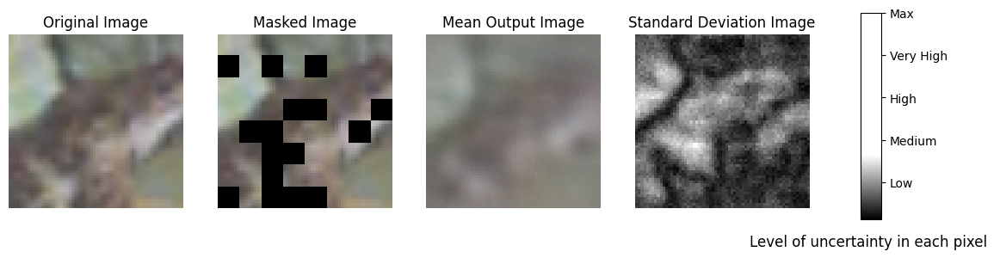

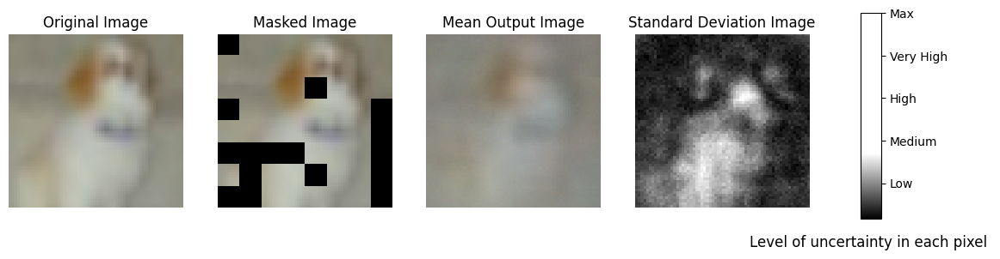

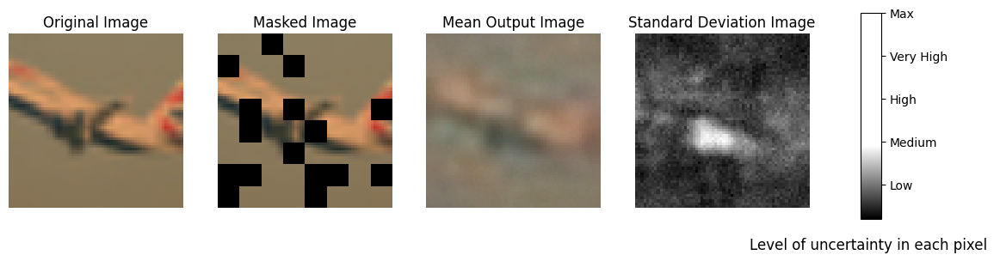

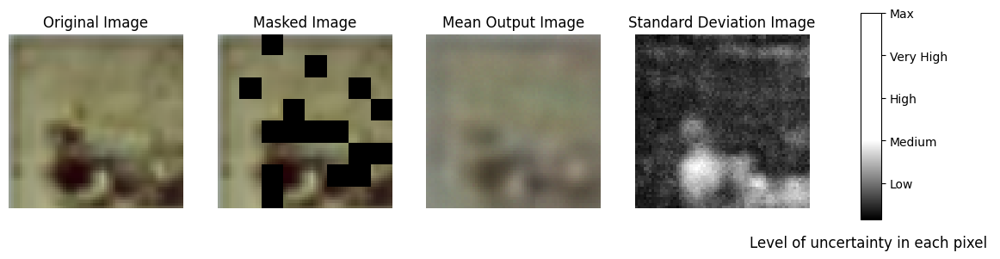

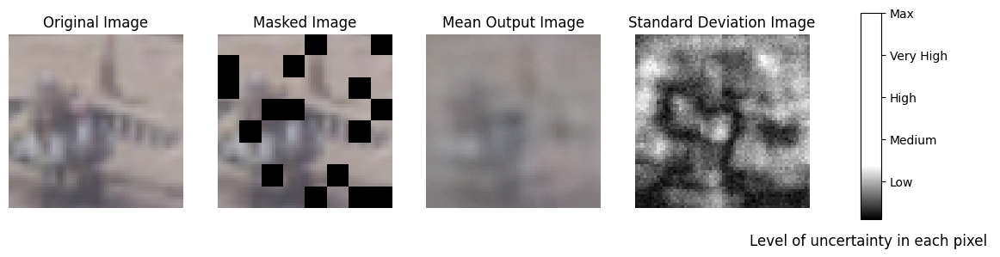

In [26]:
for i in range(30):
    std25_t_0 = np.expand_dims(std25_p[bottom_indices25[i],:,:,0],axis=-1)
    std25_t_1 = np.expand_dims(std25_p[bottom_indices25[i],:,:,1],axis=-1)
    std25_t_2 = np.expand_dims(std25_p[bottom_indices25[i],:,:,2],axis=-1)
    sum_std25_t = (std25_t_0 + std25_t_1 + std25_t_2)/3
    original_image = images[bottom_indices25[i],:,:,:]
    mask_image = masked_images25[bottom_indices25[i],:,:,:]
    mean_image = image_mean25[bottom_indices25[i],:,:,:]
    plot_results(original_image,mask_image,mean_image,sum_std25_t)
    

## 50% masking

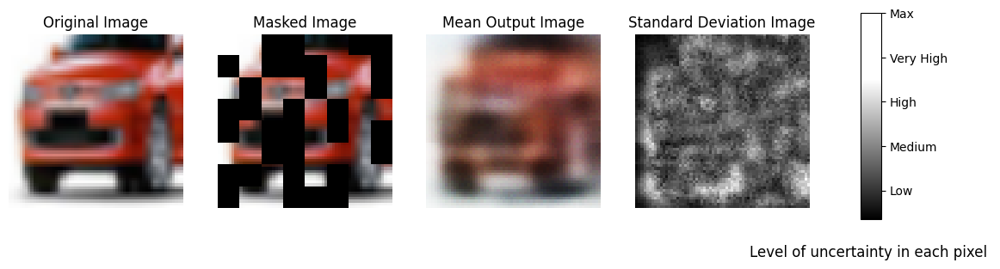

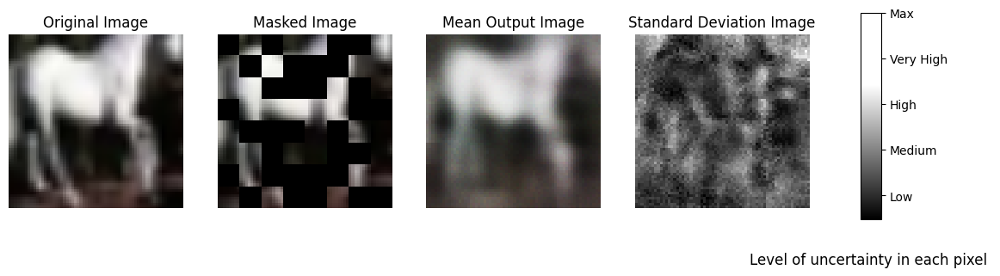

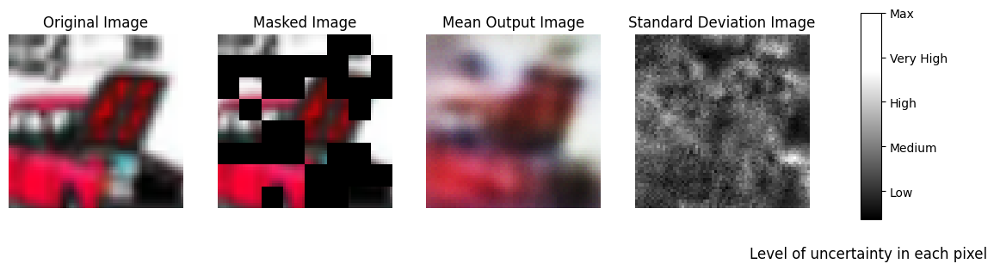

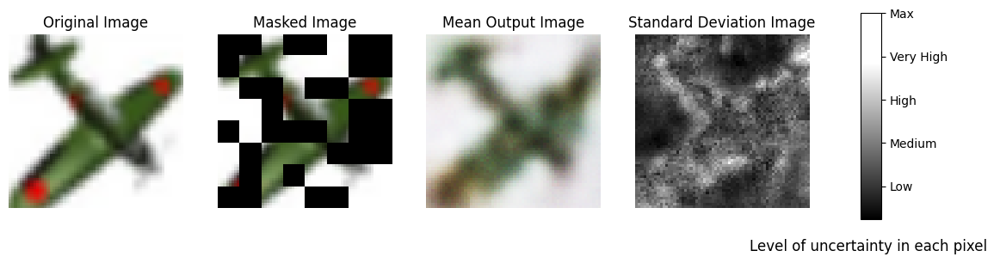

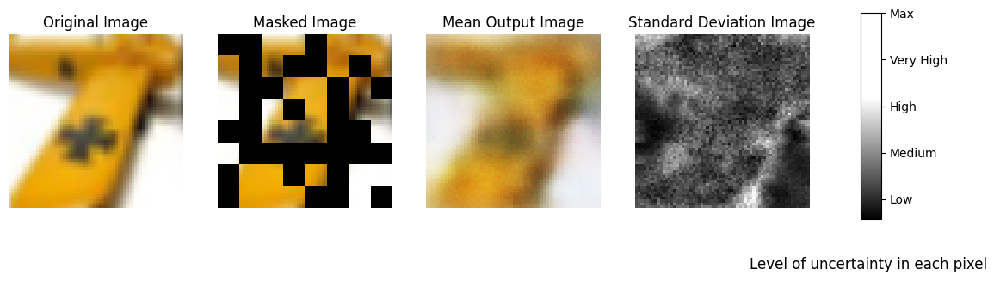

...

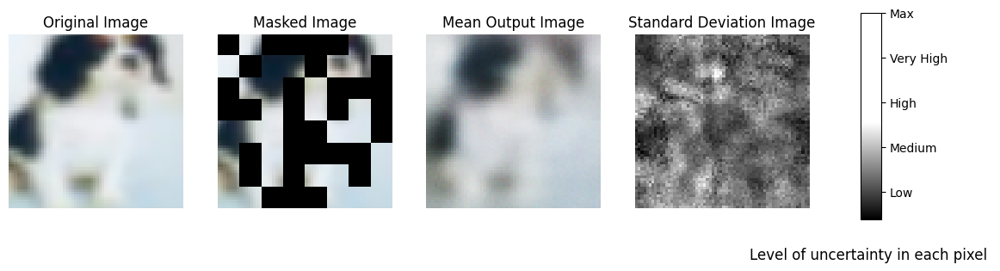

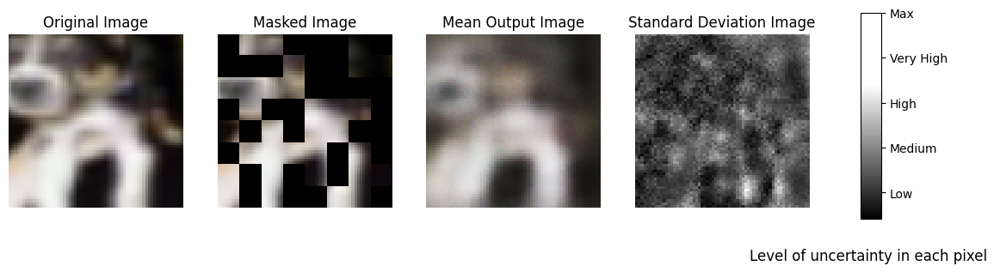

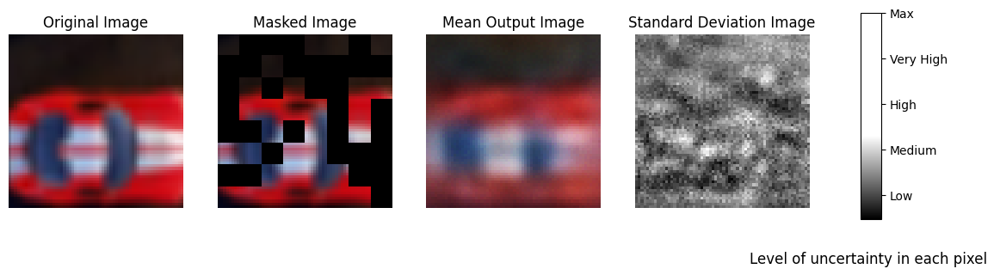

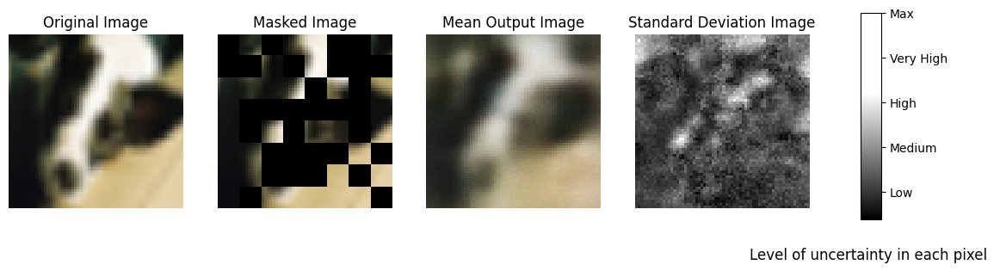

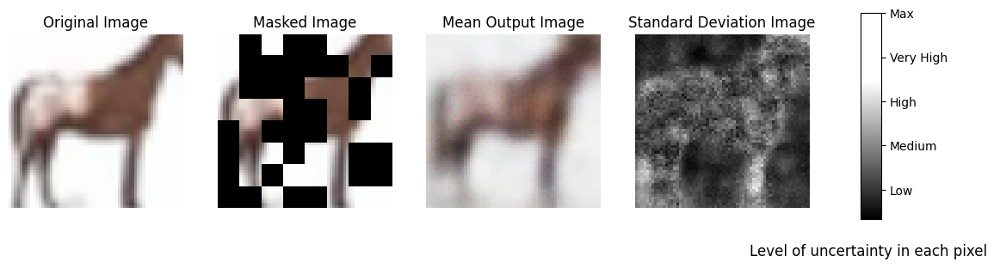

In [27]:
for i in range(30):
    std50_t_0 = np.expand_dims(std50_p[top_indices50[i],:,:,0],axis=-1)
    std50_t_1 = np.expand_dims(std50_p[top_indices50[i],:,:,1],axis=-1)
    std50_t_2 = np.expand_dims(std50_p[top_indices50[i],:,:,2],axis=-1)
    sum_std50_t = (std50_t_0 + std50_t_1 + std50_t_2)/3
    original_image = images[top_indices50[i],:,:,:]
    mask_image = masked_images50[top_indices50[i],:,:,:]
    mean_image = image_mean50[top_indices50[i],:,:,:]
    plot_results(original_image,mask_image,mean_image,sum_std50_t)   

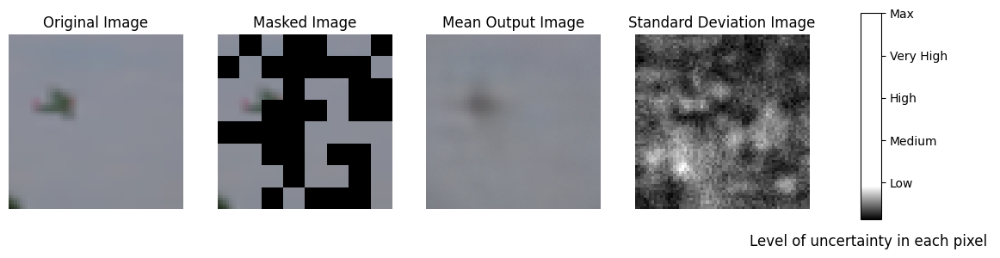

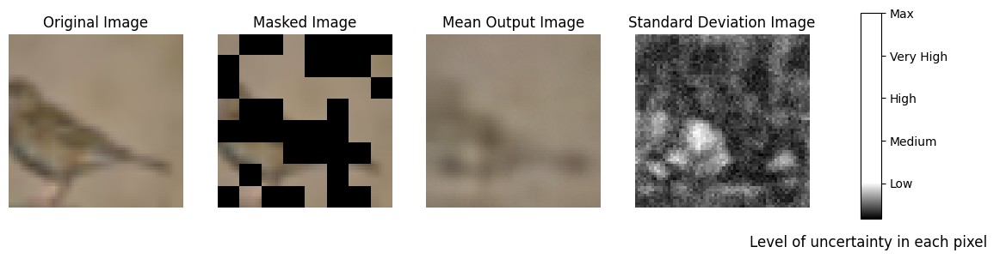

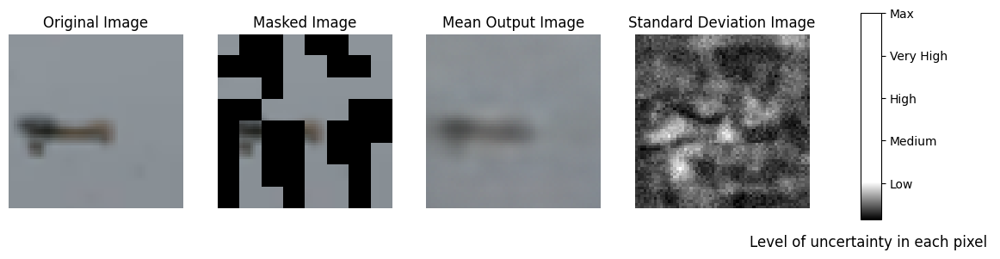

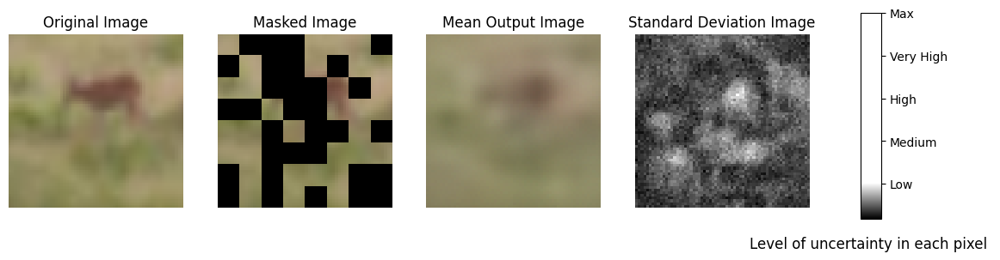

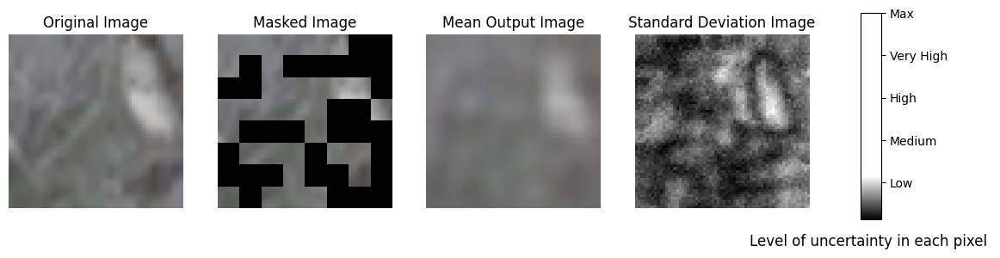

...

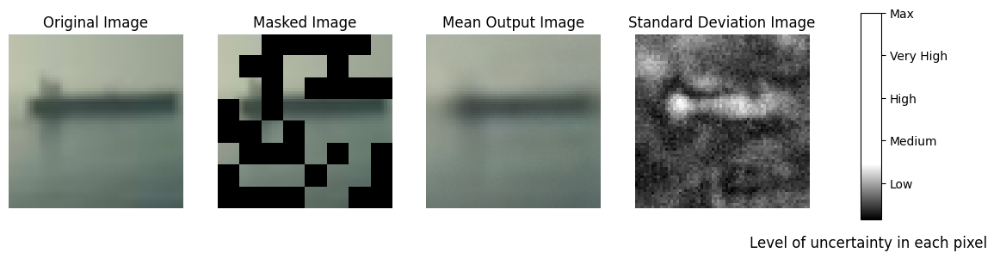

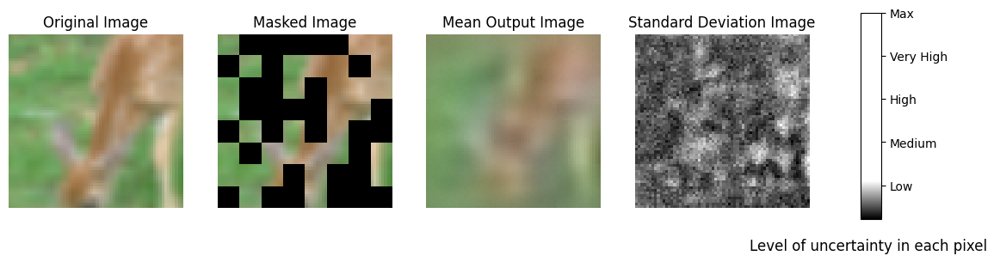

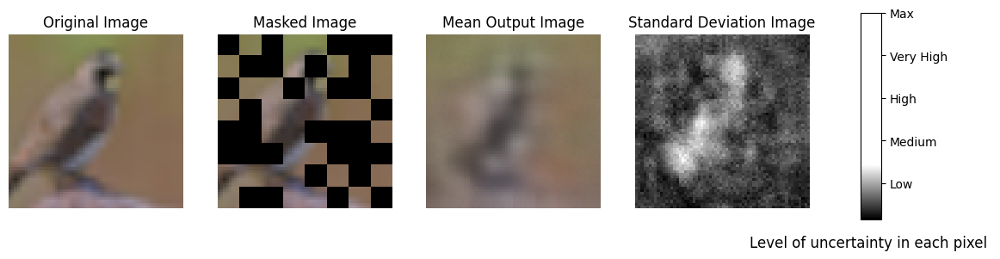

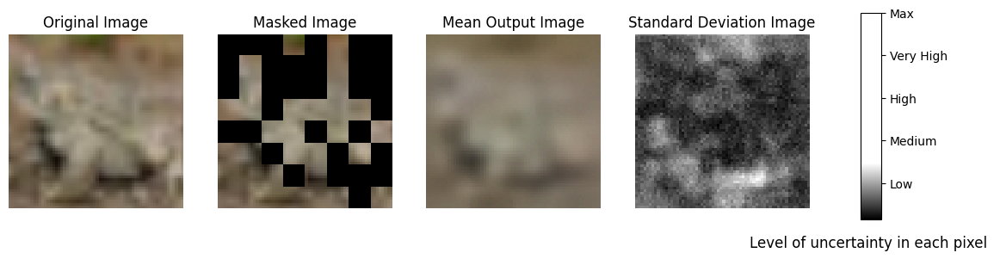

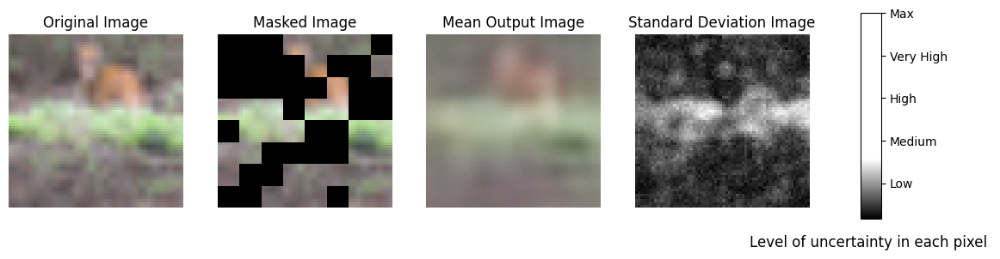

In [28]:
for i in range(30):
    std50_t_0 = np.expand_dims(std50_p[bottom_indices50[i],:,:,0],axis=-1)
    std50_t_1 = np.expand_dims(std50_p[bottom_indices50[i],:,:,1],axis=-1)
    std50_t_2 = np.expand_dims(std50_p[bottom_indices50[i],:,:,2],axis=-1)
    sum_std50_t = (std50_t_0 + std50_t_1 + std50_t_2)/3
    original_image = images[bottom_indices50[i],:,:,:]
    mask_image = masked_images50[bottom_indices50[i],:,:,:]
    mean_image = image_mean50[bottom_indices50[i],:,:,:]
    plot_results(original_image,mask_image,mean_image,sum_std50_t)
    

## 75% masking

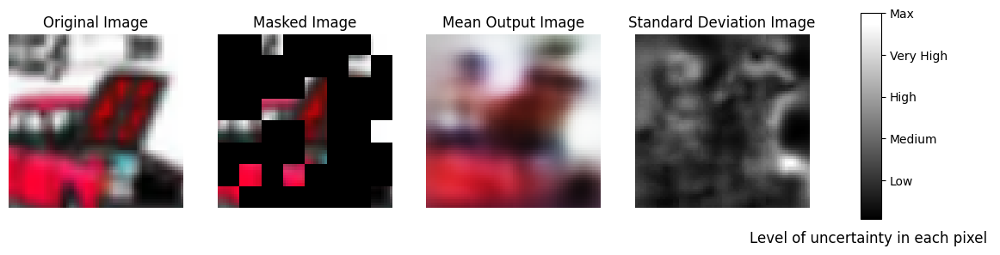

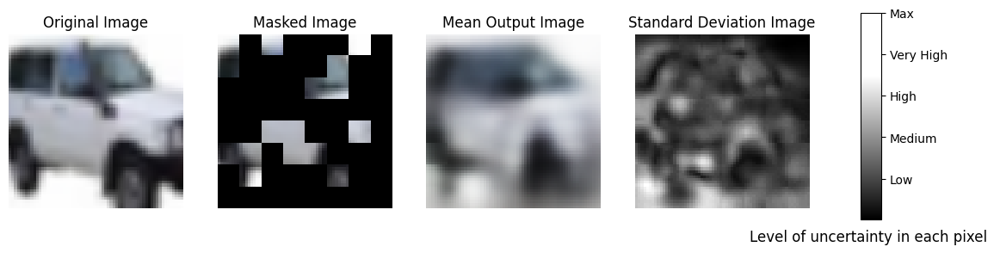

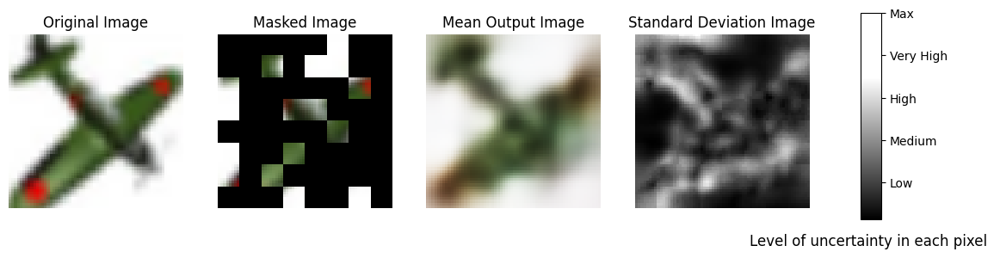

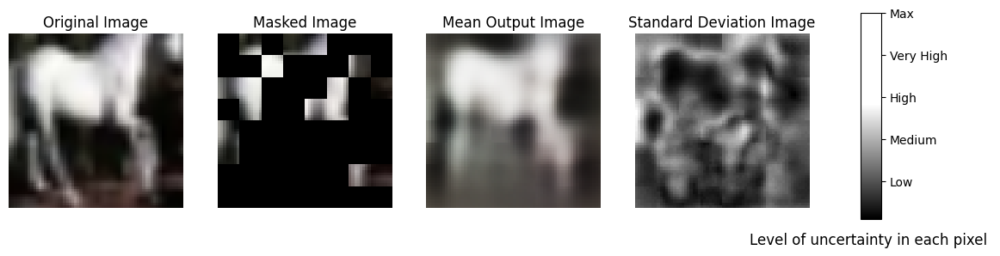

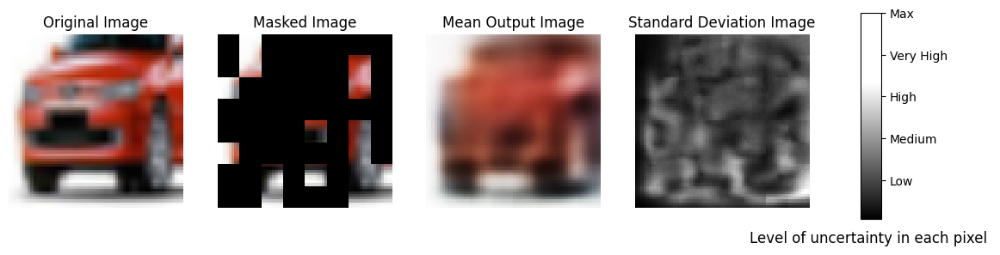

...

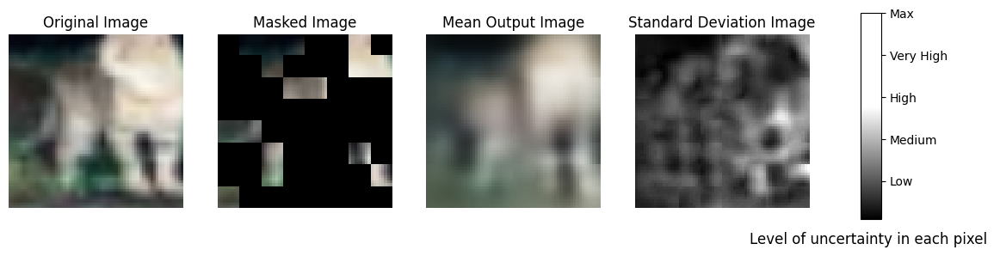

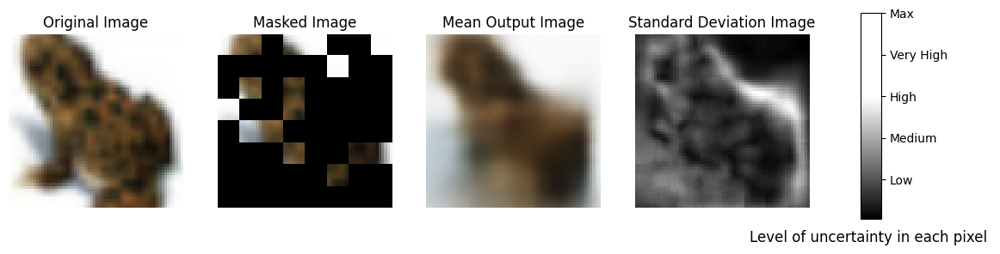

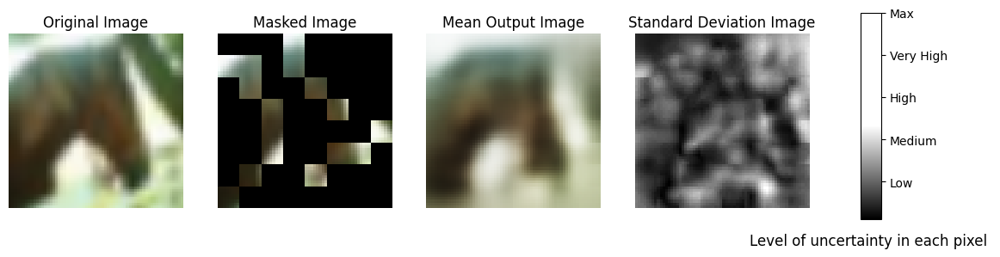

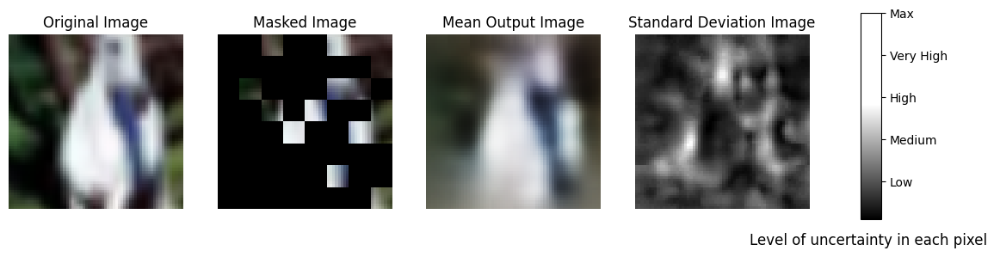

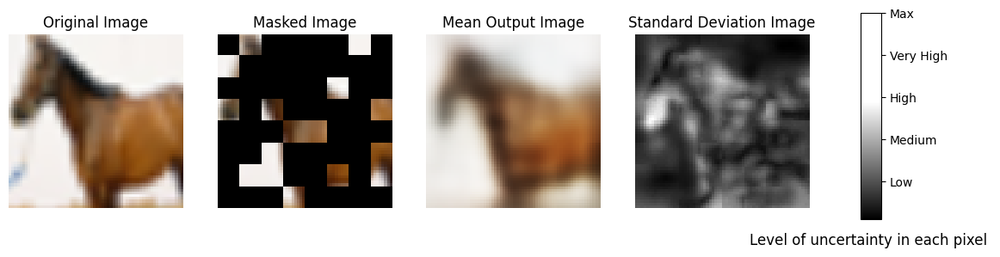

In [29]:
for i in range(30):
    std75_t_0 = np.expand_dims(std75_p[top_indices75[i],:,:,0],axis=-1)
    std75_t_1 = np.expand_dims(std75_p[top_indices75[i],:,:,1],axis=-1)
    std75_t_2 = np.expand_dims(std75_p[top_indices75[i],:,:,2],axis=-1)
    sum_std75_t = (std75_t_0 + std75_t_1 + std75_t_2)/3
    original_image = images[top_indices75[i],:,:,:]
    mask_image = masked_images75[top_indices75[i],:,:,:]
    mean_image = image_mean75[top_indices75[i],:,:,:]
    plot_results(original_image,mask_image,mean_image,sum_std75_t)

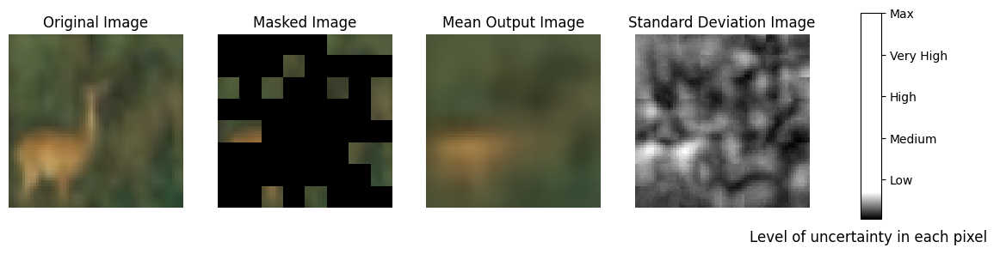

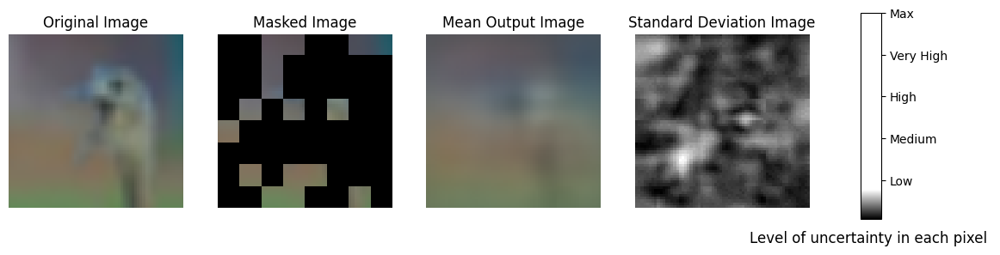

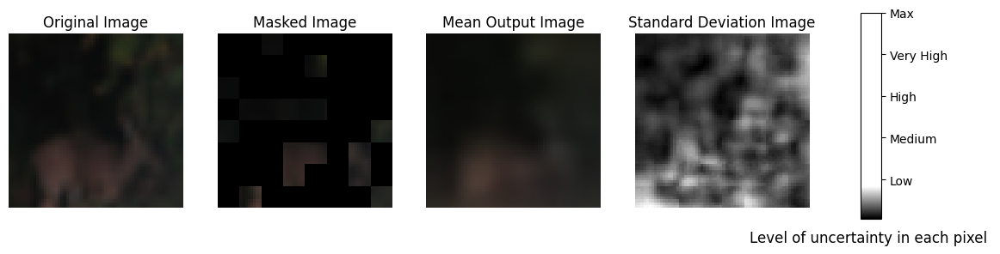

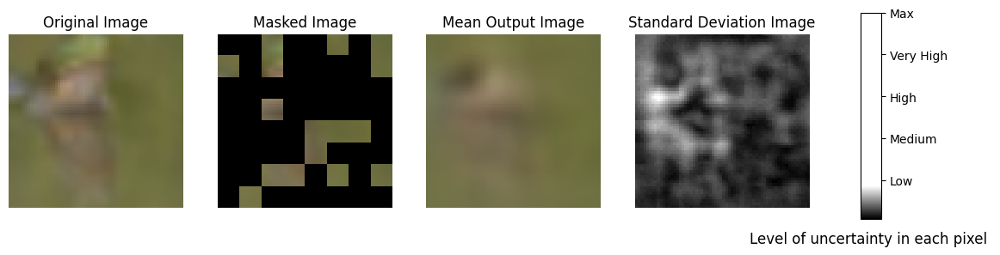

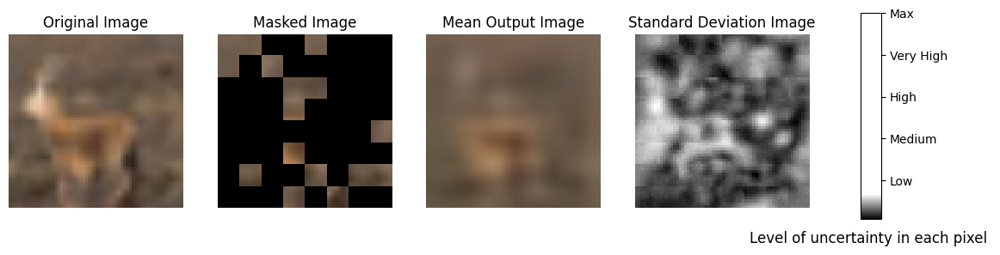

...

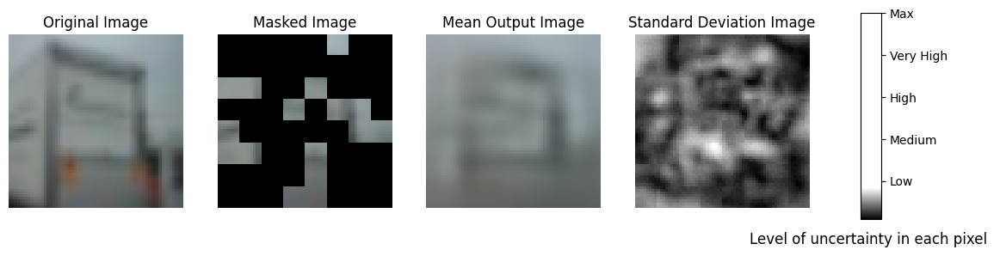

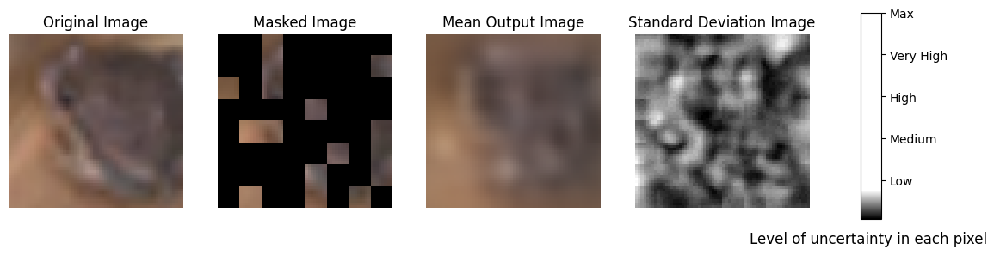

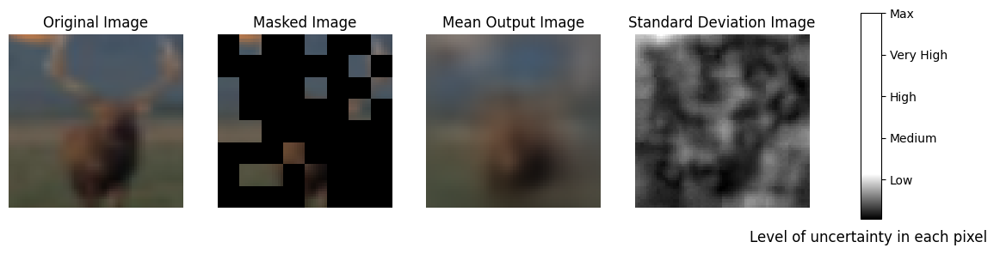

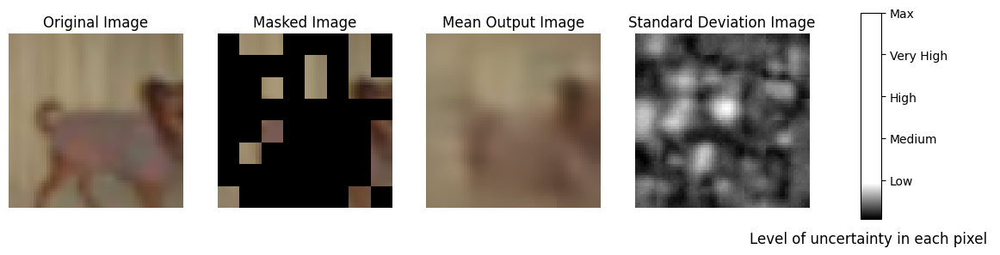

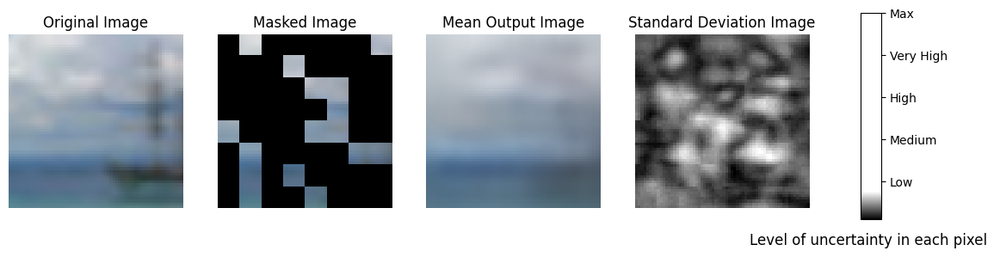

In [30]:
for i in range(30):
    std75_t_0 = np.expand_dims(std75_p[bottom_indices75[i],:,:,0],axis=-1)
    std75_t_1 = np.expand_dims(std75_p[bottom_indices75[i],:,:,1],axis=-1)
    std75_t_2 = np.expand_dims(std75_p[bottom_indices75[i],:,:,2],axis=-1)
    sum_std75_t = (std75_t_0 + std75_t_1 + std75_t_2)/3
    original_image = images[bottom_indices75[i],:,:,:]
    mask_image = masked_images75[bottom_indices75[i],:,:,:]
    mean_image = image_mean75[bottom_indices75[i],:,:,:]
    plot_results(original_image,mask_image,mean_image,sum_std75_t)  